## Visualizaton of samples from the training set
### Flow reactor data

In [26]:
import os
import pandas
import yaml
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from xrsdkit.system import System
from xrsdkit.visualization import  draw_xrsd_fit

import warnings
warnings.filterwarnings("ignore")

In [18]:
data_ind = pandas.read_csv("dataset_index.csv")
data = pandas.read_csv("main_classifier_results.csv")
data = data.merge(data_ind[['sample_id','yml_file','data_file' ]], left_on='sample_id', right_on='sample_id')
data.head()

,Unnamed: 0,experiment_id,sample_id,system_class,system_class_pr,diffuse_binary,disordered_binary,crystalline_binary,diffuse_binary_pr,disordered_binary_pr,crystalline_binary_pr,yml_file,data_file
0,221,R0_201811,R0_201811_1541372847,diffuse,diffuse__diffuse,True,False,False,True,False,False,gridsearch22_xrsd_system.yml,gridsearch22_dz_bgsub.dat
1,226,R0_201811,R0_201811_1541451179,diffuse,diffuse,True,False,False,True,False,False,gridsearch33_xrsd_system.yml,gridsearch33_dz_bgsub.dat
2,235,R0_201811,R0_201811_1541312605,diffuse,diffuse__diffuse,True,False,False,True,False,False,gridsearch11_xrsd_system.yml,gridsearch11_dz_bgsub.dat
3,244,R0_201811,R0_201811_1541366472,diffuse,unidentified,True,False,False,False,False,False,gridsearch20_xrsd_system.yml,gridsearch20_dz_bgsub.dat
4,232,R0_201811,R0_201811_1541364785,diffuse__diffuse,diffuse__diffuse,True,False,False,True,False,False,gridsearch19_xrsd_system.yml,gridsearch19_dz_bgsub.dat


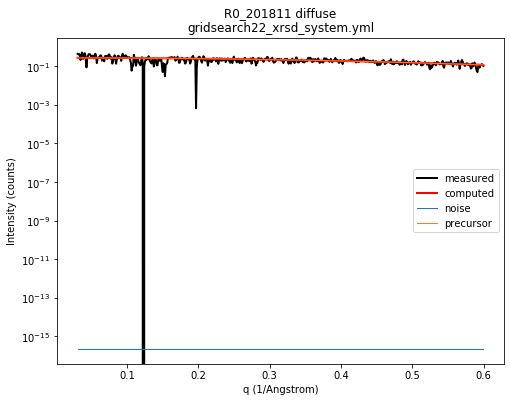

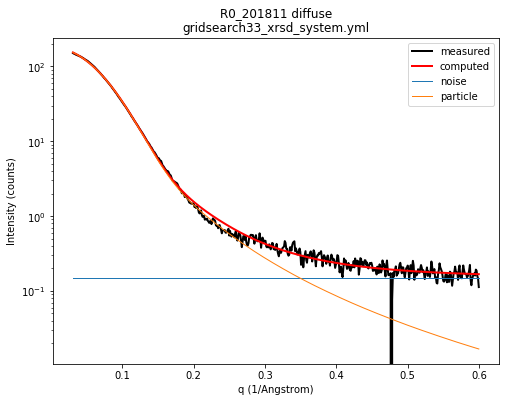

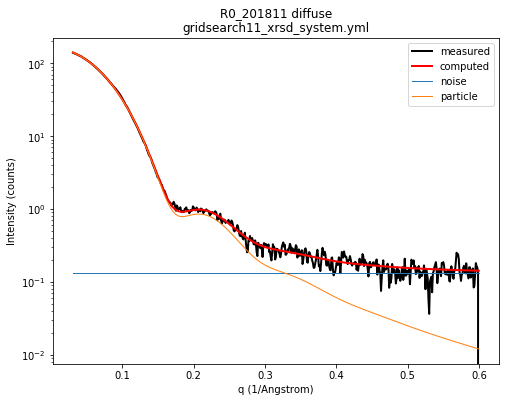

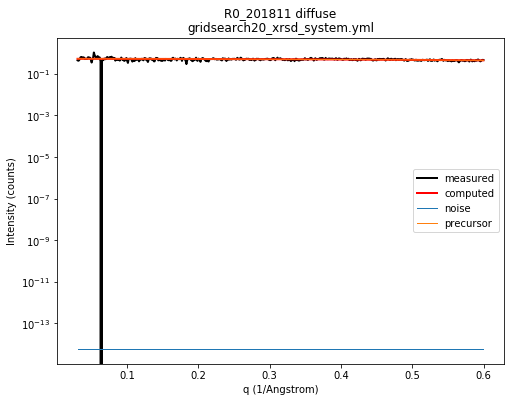

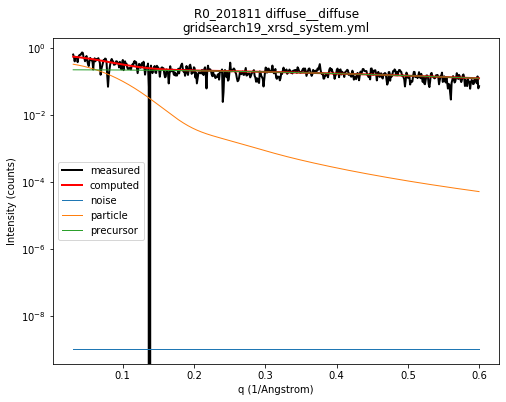

...

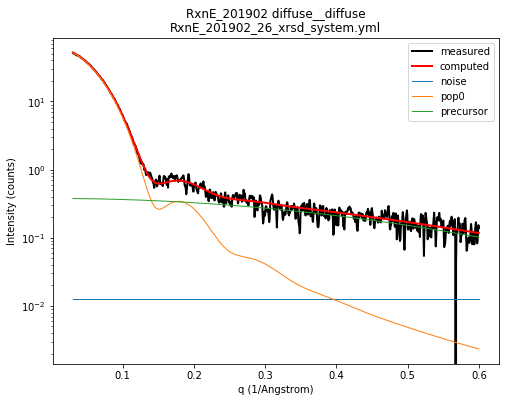

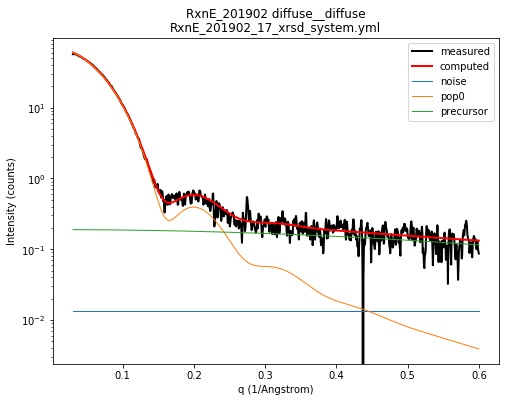

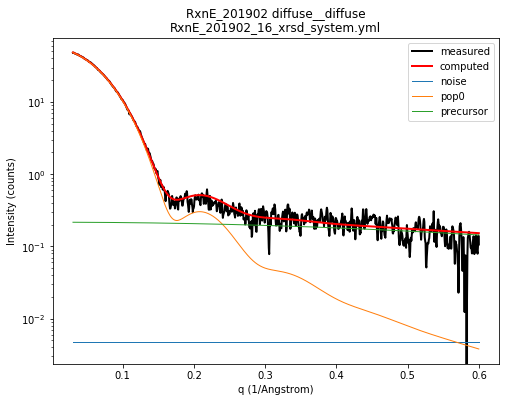

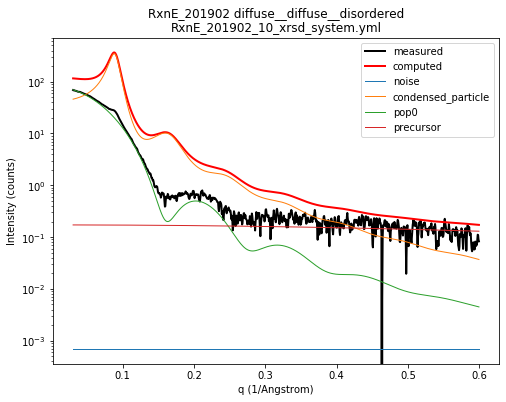

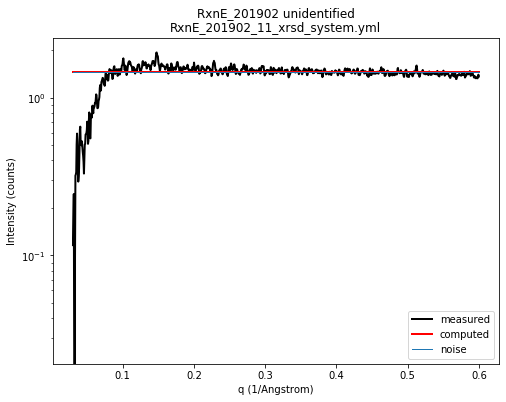

In [35]:
for index, s in data.iterrows():
    yml_path = '../xrsdkit_modeling/flowreactor_pd_nanoparticles/dataset/' + s[1] + '/' + s['yml_file']
    with open(yml_path, 'r') as stream:
        data_loaded = yaml.safe_load(stream)
    f = open('../xrsdkit_modeling/flowreactor_pd_nanoparticles/dataset/' + s[1] + '/' + s['data_file'],'r')
    q_I = np.loadtxt(f,dtype=float)
    sys = System.from_dict(data_loaded)
    # create figure and save it 
    fig, ax = plt.subplots(1,1, figsize=(8,6))
    _ = draw_xrsd_fit(ax,sys,q_I[:,0],q_I[:,1])
    ax.set_title(s['experiment_id']+ " "+ s['system_class'] + '\n' + s['yml_file'])
    fig_path = 'plots_of_all_samples/'+s['experiment_id']+ "_"+ s['system_class'] + '_' + s['yml_file'] +'.pdf' 
    plt.savefig(fig_path)